In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob
%matplotlib inline

Load functions that are inside `'main.py'`

In [2]:
from main import abs_sobel_thresh, mag_thresh, dir_thresh_abs
from main import dir_thresh, hls_thresh, find_curvatures, curvature_radius

## Setup utility function for plotting

In [3]:
def plotCompare(img1, func, title1='', title2='', storeName=''):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=((16,6)))
    ax[0].imshow(img1)
    ax[0].set_title(title1)
    ax[1].imshow(func(img1))
    ax[1].set_title(title2)
    #plt.savefig('./output_images/'+storeName)
    plt.show()

## Camera distortion calibration

In [4]:
# Camera distortion calibration
from Calibration import Calibration
myCal = Calibration(width=9, hgt=6)
myCal.set_img_location('camera_cal', 'calibration*.jpg')
myCal.calibrate()

20 image files to process...
Distortion calibration complete. 17 images used


Let's check out the calibration results...

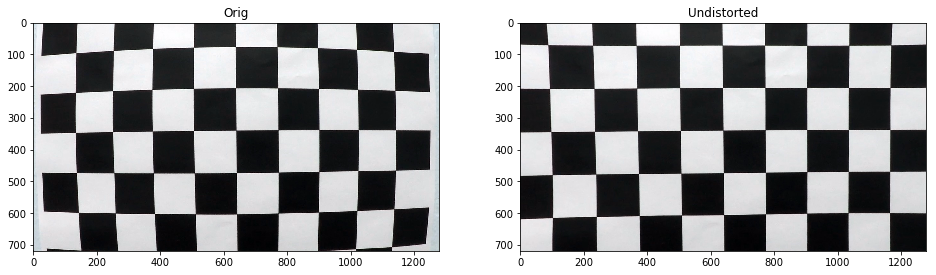

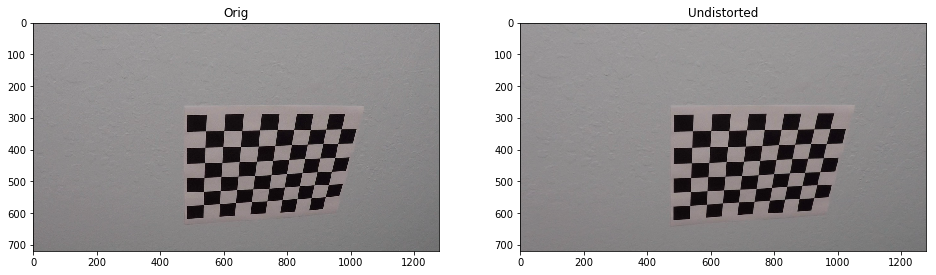

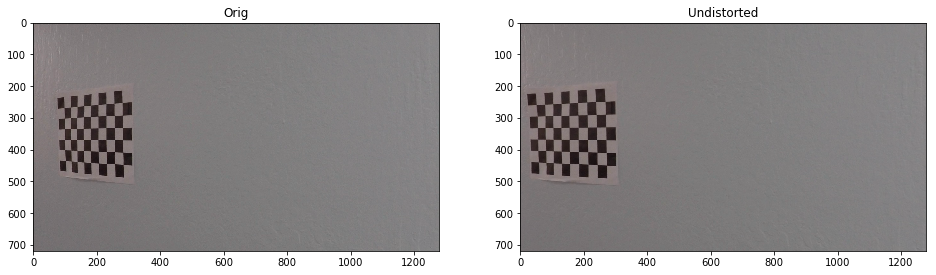

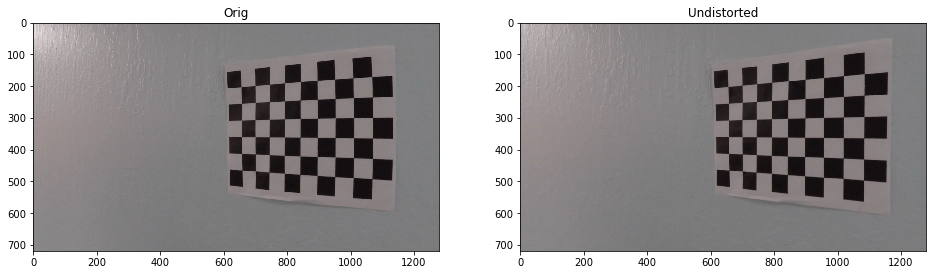

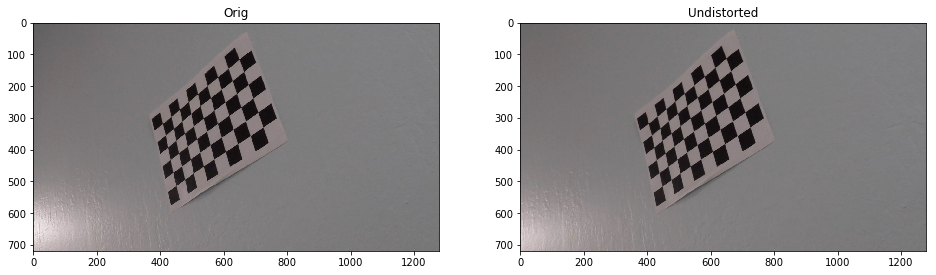

...

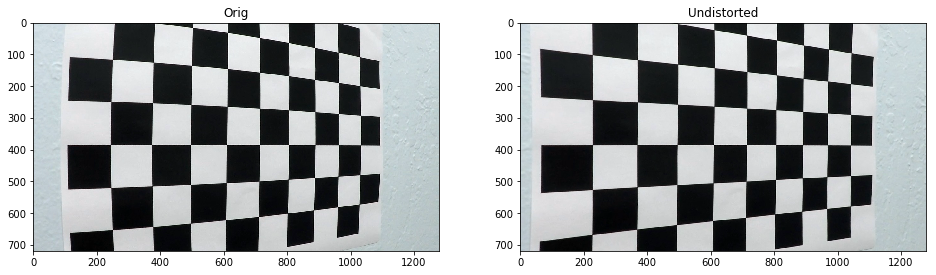

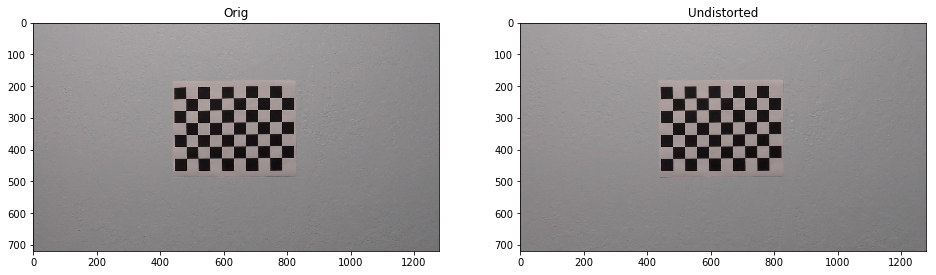

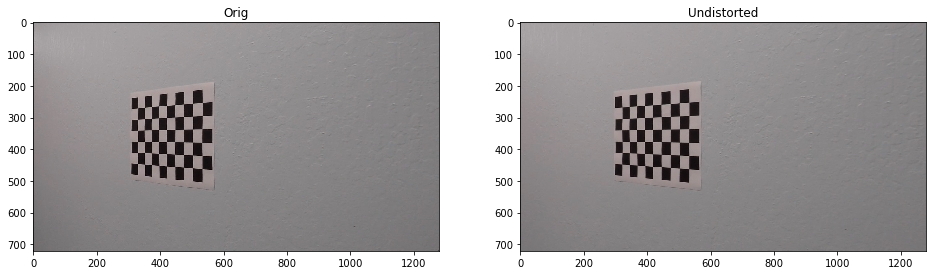

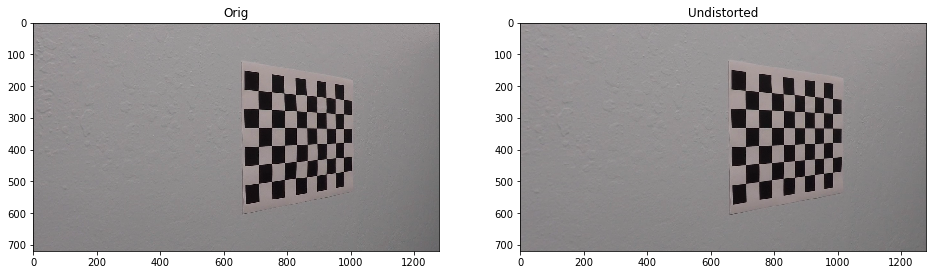

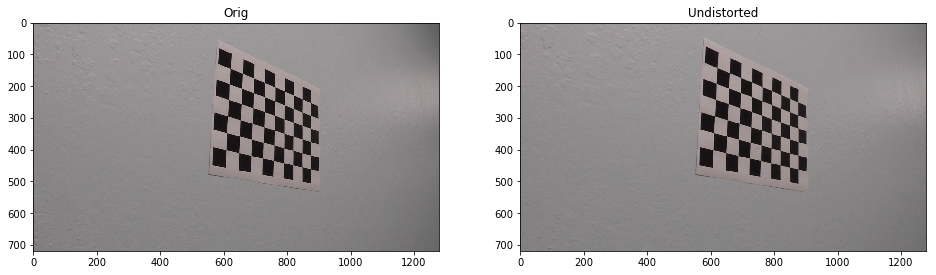

In [5]:
# load calibration images
cal_images = glob.glob('camera_cal/calibration*.jpg')

# run each image thru calibration and plot
for fname in cal_images:
    img = cv2.imread(fname)
    plotCompare(img, myCal.apply, 'Orig', 'Undistorted')

## Load road test images

In [6]:
# load road test images into a list (of images)
test_fnames = glob.glob('test_images/test*.jpg')
test_images = []
for fname in test_fnames:
    img_bgr = cv2.imread(fname)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # immediately convert to RGB to avoid confusion
    img = myCal.apply(img_rgb) # undistort, before we forget!
    test_images.append(img)

Let's take a look at the images...

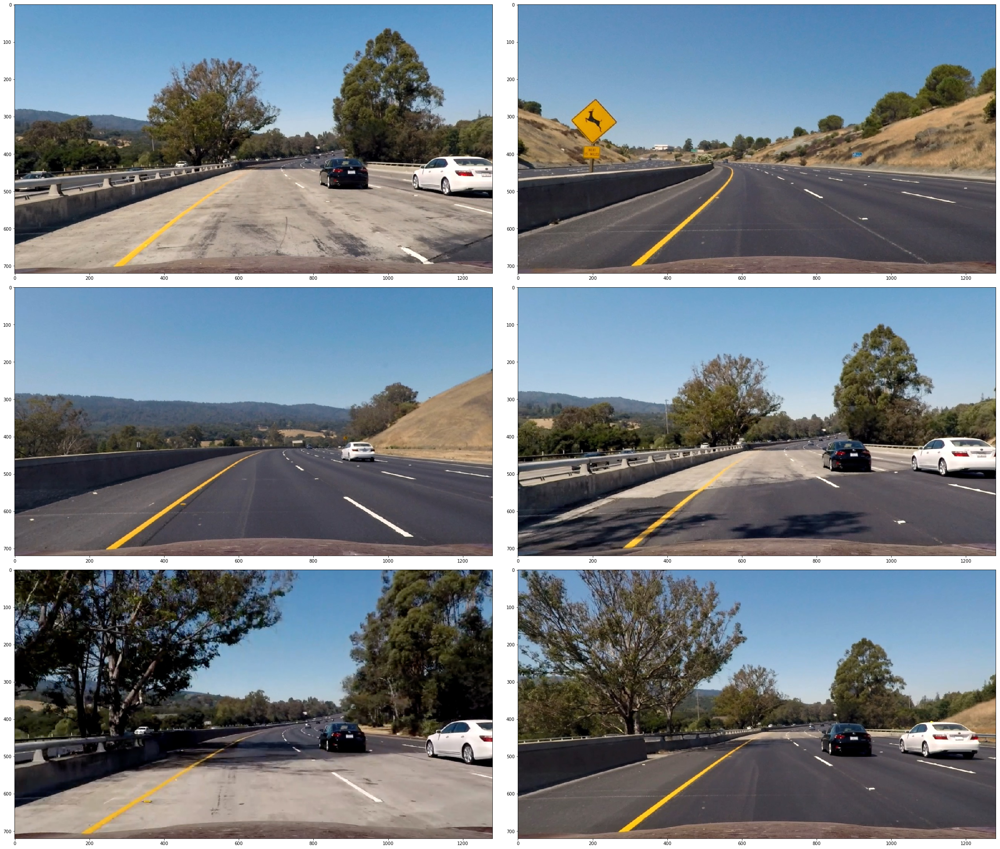

In [7]:
# plot images
f, ax = plt.subplots(3, 2, figsize=(32,27))
ax = ax.flatten()
f.tight_layout()
for idx, img in enumerate(test_images):
    ax[idx].imshow(img)
plt.show()

In [8]:
# create gray scale imgs via list comprehension
gray_images = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in test_images]

### Experiment with gradient and colorspace thresholding on these

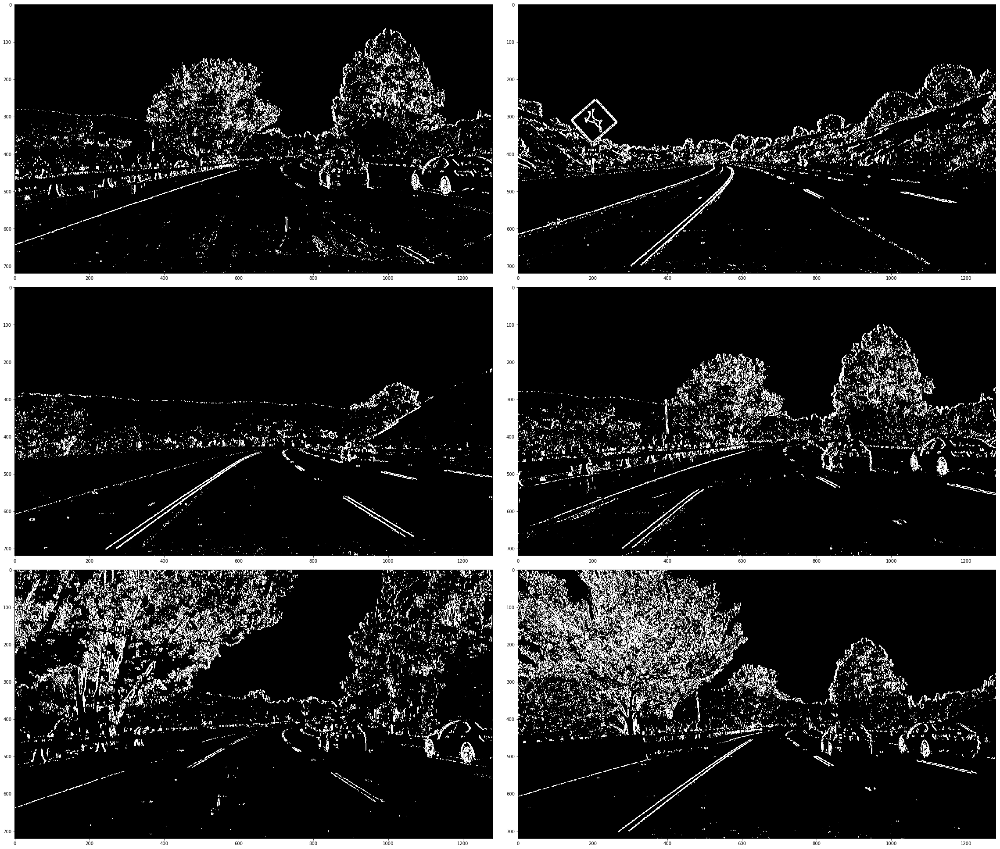

In [9]:
# X-sobel threshold
f, ax = plt.subplots(3, 2, figsize=(32,27))
ax = ax.flatten()
f.tight_layout()

sobelx_images = []

for idx, gray in enumerate(gray_images):
    img = abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(20,200))
    sobelx_images.append(img)
    ax[idx].imshow(img, cmap='gray')
plt.show()

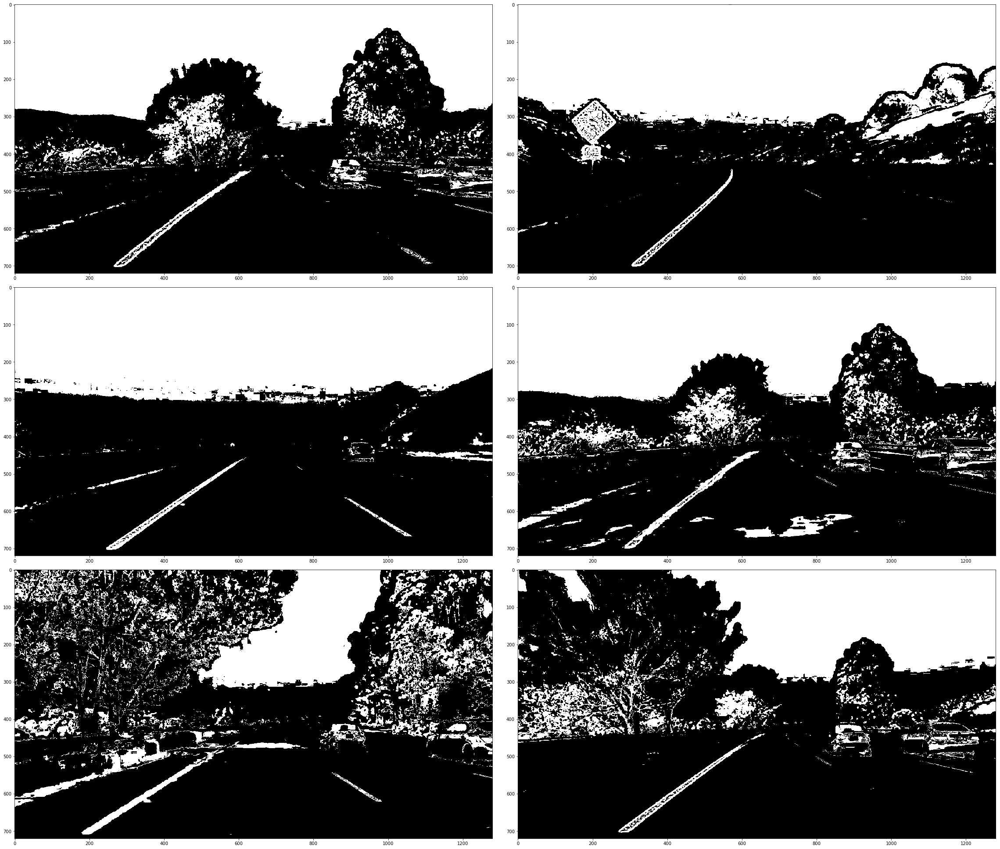

In [10]:
# HLS threshold
f, ax = plt.subplots(3, 2, figsize=(32,27))
ax = ax.flatten()
f.tight_layout()

hls_s_images = []

for idx, img in enumerate(test_images):
    img = hls_thresh(img, ch_sel='s', thresh=(90,255))
    hls_s_images.append(img)
    ax[idx].imshow(img, cmap='gray')
plt.show()

### Combine Sobel-X and HLS S-channel

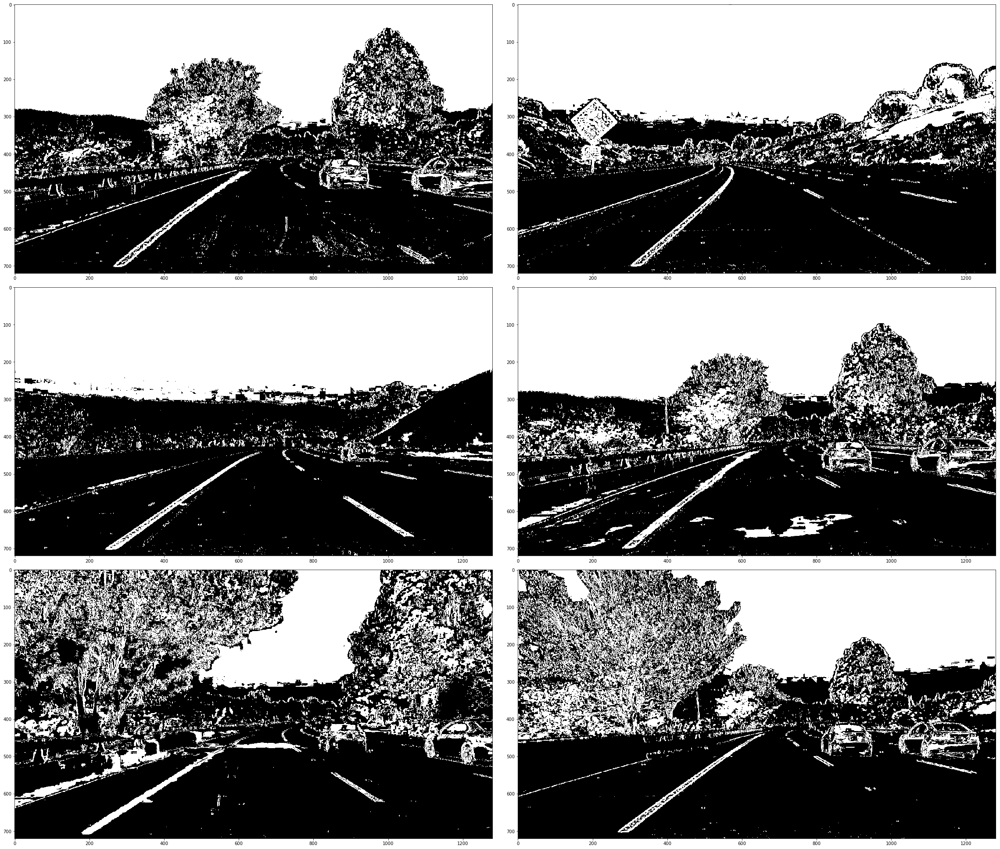

In [11]:
f, ax = plt.subplots(3, 2, figsize=(32,27))
ax = ax.flatten()
f.tight_layout()

combo_images = []

for idx, hls_img in enumerate(hls_s_images):
    combo_img = (hls_img | sobelx_images[idx])
    combo_images.append(combo_img)
    ax[idx].imshow(combo_img, cmap='gray')
plt.show()

## Perspective Transform

In [12]:
# Perspective transform
from PerspectiveTransform import PerspectiveTransform
myXform = PerspectiveTransform()

### Load sample straight line images
We'll use these to "calibrate" our perspective transform by:
- extract polygon corners on the driver's eye view image
- specify where we desired these corners to be on the bird's eye view image
- calculate the transformation matrix `M` based on these corners

In [13]:
straight_fnames = glob.glob('test_images/straight_lines*.jpg')
straight_images = []
for fname in straight_fnames:
    img_bgr = cv2.imread(fname)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # immediately convert to RGB
    img = myCal.apply(img_rgb)
    straight_images.append(img)

In [14]:
gray_straight_images = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in straight_images]

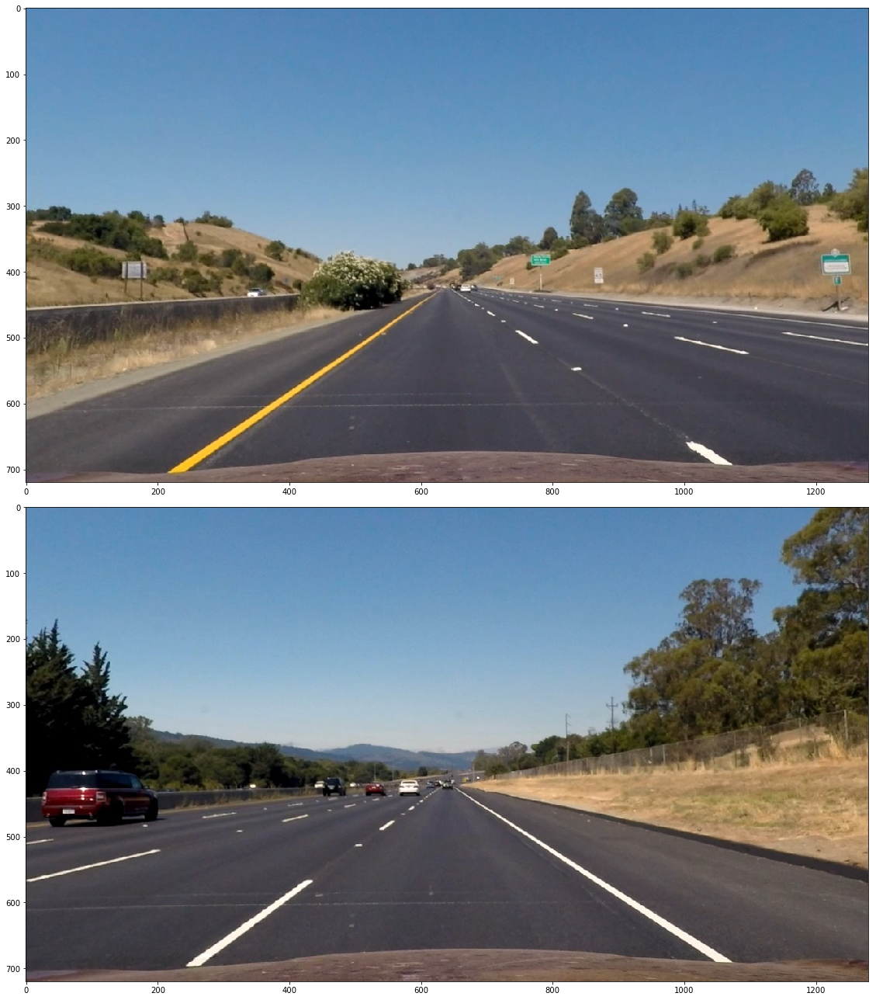

In [15]:
f, ax = plt.subplots(2, 1, figsize=(16,18))
ax = ax.flatten()
f.tight_layout()

for idx, img in enumerate(straight_images):
    ax[idx].imshow(img)
plt.show()

Manually pick out the polygon on the source (driver's eye view) image. We're going to use the near dashed line on the left side, since that looks like a complete dash line. **Each dash line = 100 ft in length**

In [16]:
# manually draw source polygon...

# Left lane line's X&Y end points
xl = np.array([265, 440])
yl = np.array([695, 565])

# Right lane line's X coordinates. Using same Y coordinates as left lane line
xr = np.array([1055, 860])

# center of the L&R lines
xc = 655

#Flip order of right line endpoints to specify an enclosing polygon
xpoly = np.concatenate((xl, xr[::-1]))
ypoly = np.concatenate((yl, yl[::-1]))

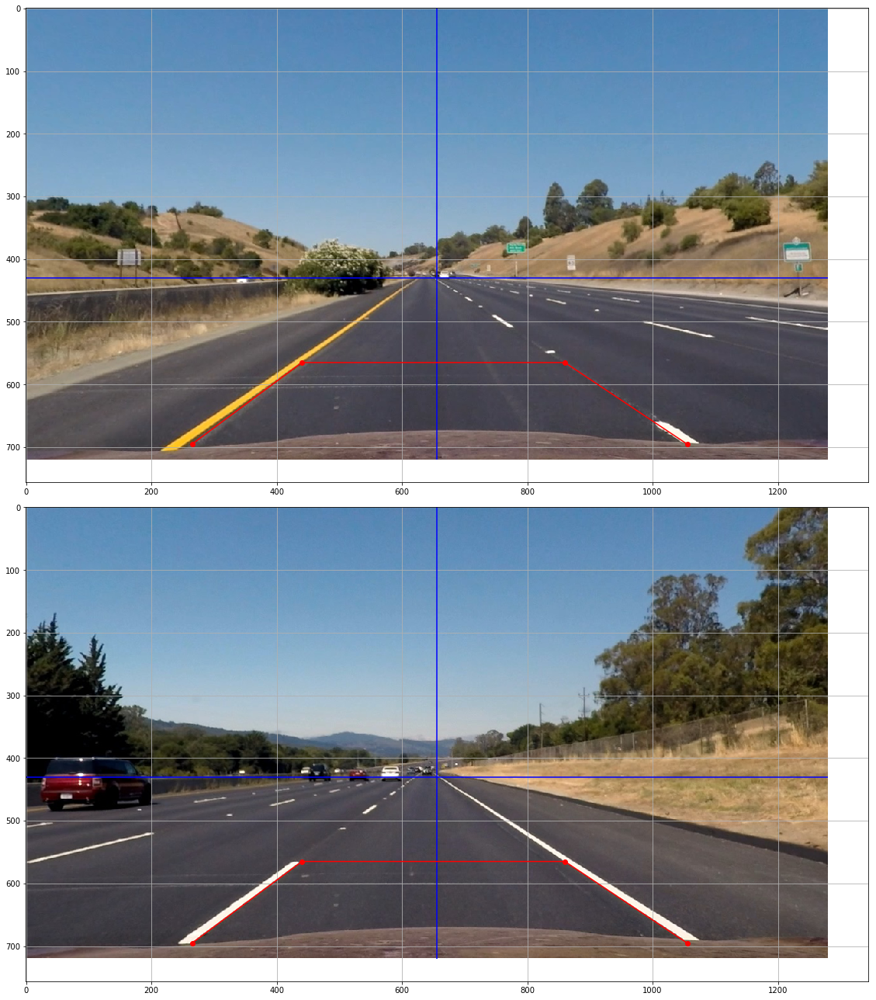

In [17]:
# draw polygon on image
f, ax = plt.subplots(2, 1, figsize=(16,18))
ax = ax.flatten()
f.tight_layout()

ax[0].imshow(straight_images[0])
ax[0].vlines(xc,0,720,'b') # center line of polygon
ax[0].hlines(430,0,1280,'b') # near-horizon ref line
ax[0].plot(xpoly,ypoly,'ro-') # draw polygon
ax[0].grid(True)

ax[1].imshow(straight_images[1])
ax[1].vlines(xc,0,720,'b') # center line of polygon
ax[1].hlines(430,0,1280,'b') # near-horizon ref line
ax[1].plot(xpoly,ypoly,'ro-') # draw polygon
ax[1].grid(True)

plt.show()

### Convert polygon into format needed for perspective tranform 

In [18]:
#set src coordinates
src_x = xpoly
src_y = ypoly
src_road = np.stack((src_x, src_y), axis=0).T.astype(np.float32)
print(src_road)

[[  265.   695.]
 [  440.   565.]
 [  860.   565.]
 [ 1055.   695.]]


In [19]:
# Now let's determine what the destination coordinate for these area are...
# Note: ASSUME this boxed distance to be:
# - 12 ft wide (min lane width)
# - 10ft long (dashed lane line length)
# Per US Regulations
dst_width = 1280
dst_left_pct = 0.25
dst_right_pct = 0.75
dst_hgt = 720
dst_box_hgt = 80

dst_x = dst_width*np.float32([dst_left_pct, dst_left_pct, dst_right_pct, dst_right_pct])
dst_y = [dst_hgt, dst_hgt-dst_box_hgt, dst_hgt-dst_box_hgt, dst_hgt]

dst_road = np.stack((dst_x, dst_y), axis=0).T.astype(np.float32)
print(dst_road)

[[ 320.  720.]
 [ 320.  640.]
 [ 960.  640.]
 [ 960.  720.]]


**Calibrate the perspective transform...**

In [20]:
myXform.set_src(src_road)
myXform.set_dst(dst_road)
myXform.calibrate()

**We'll also need to keep track of the scaling relationship betweel bird's eye view pixels, to real world physical dimensions. This is the reason the dashed lane line segment was specifically chosen.**
- length of the dash line = 10 ft
- width of lane = 12 ft (assume)

In [21]:
box_hgt_m = 10*(0.305) # convert to meters
box_width_m = 12*(0.305) # convert to meters

m_per_pixel_x = box_width_m / (dst_width*(dst_right_pct-dst_left_pct))
m_per_pixel_y = box_hgt_m / (dst_box_hgt)

print('X m/pixel = {}'.format(m_per_pixel_x))
print('Y m/pixel = {}'.format(m_per_pixel_y))

X m/pixel = 0.00571875
Y m/pixel = 0.038125


We'll also setup a border polygon around the bird's eye view, which we'll inverse transform back to driver's view to outline the area.

In [22]:
xmax = 1280; ymax = 720
bird_view_border = np.float32([[[0,ymax],[0,0],[xmax,0],[xmax,ymax],[0,ymax]]])
driver_view_border = myXform.inv_transform_pts(bird_view_border)

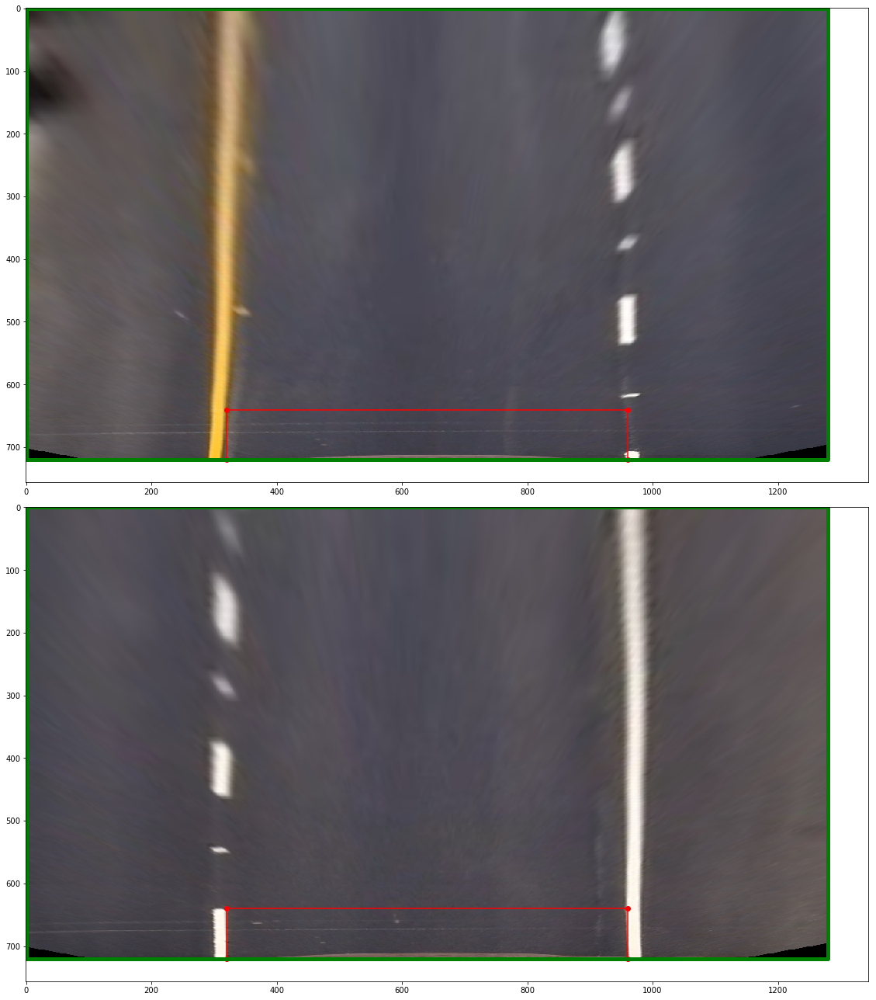

In [23]:
# birds eye view
f, ax = plt.subplots(2, 1, figsize=(16,18))
ax = ax.flatten()
f.tight_layout()

images_bird = []

for idx, img in enumerate(straight_images):
    images_bird.append(myXform.transform(img))
    ax[idx].imshow(images_bird[idx])
    ax[idx].plot(dst_x, dst_y,'ro-')
    ax[idx].plot(bird_view_border[0,:,0], bird_view_border[0,:,1], 'g-', linewidth=5)
plt.show()

### Transform from bird's eye back to driver's view
For sanity check sake

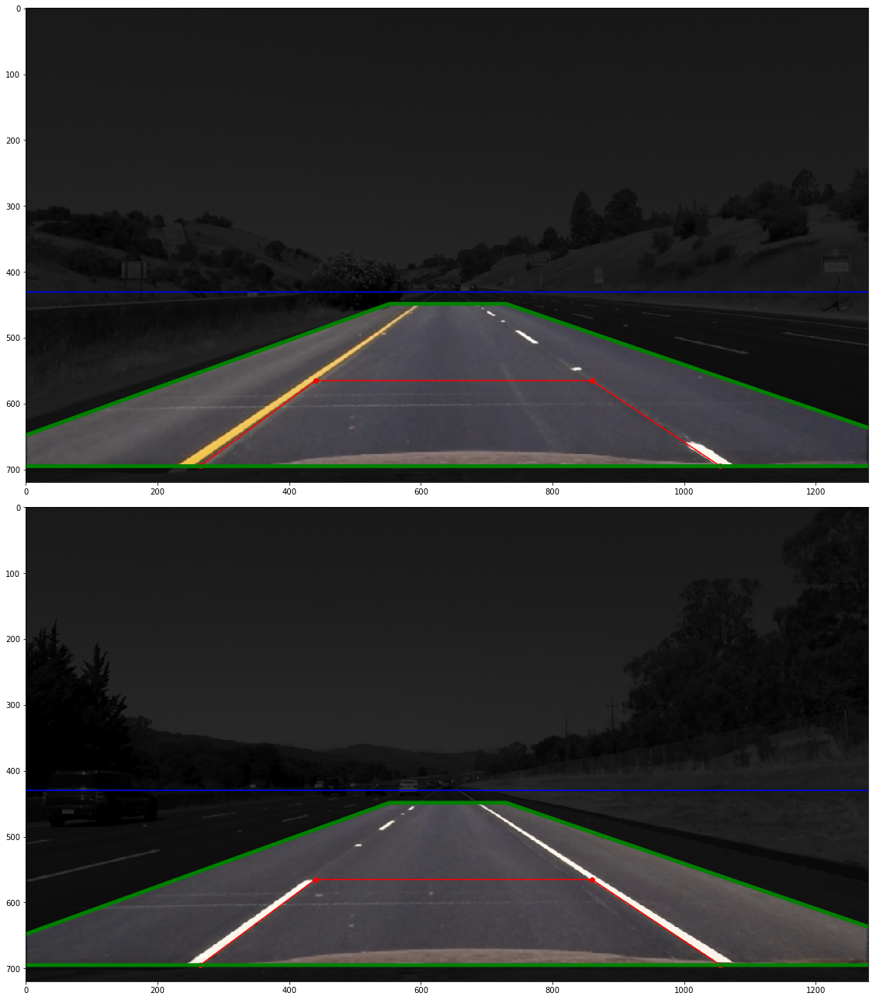

In [24]:
f, ax = plt.subplots(2, 1, figsize=(16,18))
ax = ax.flatten()
f.tight_layout()

for idx, img in enumerate(images_bird):
    img_reconstruct = cv2.addWeighted(myXform.inv_transform(img), 0.8,
                                      cv2.cvtColor(gray_straight_images[idx], cv2.COLOR_GRAY2RGB), 0.2, 0.0)
    ax[idx].imshow(img_reconstruct)
    ax[idx].plot(src_x, src_y,'ro-')
    ax[idx].hlines(430,0,1280,'b')
    ax[idx].plot(driver_view_border[0,:,0], driver_view_border[0,:,1], 'g-', linewidth=5)
    ax[idx].set_xlim(0,1280)
plt.show()

Looks good! Now let's apply it to the rest of the test images...

## Apply perspective transform

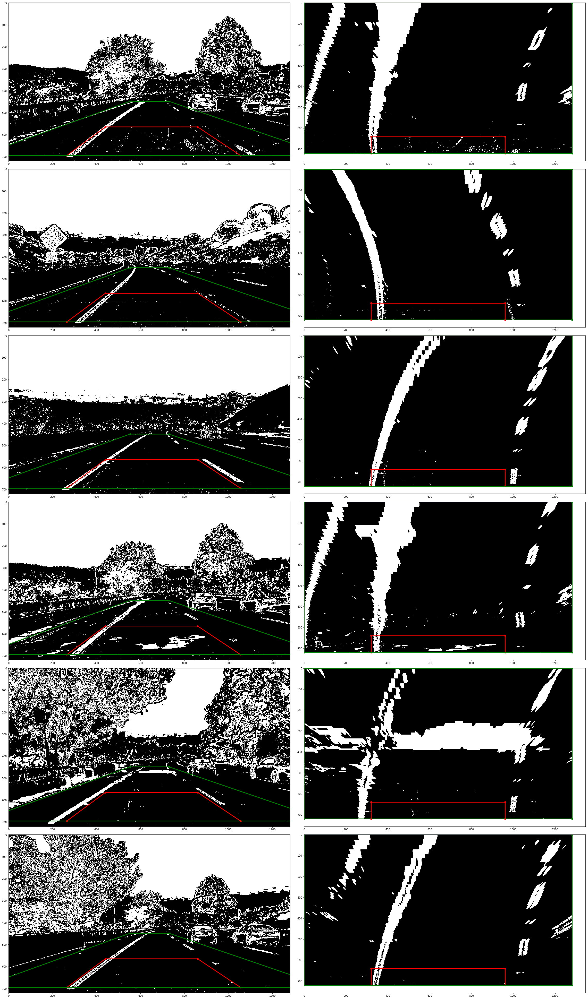

In [25]:
f, ax = plt.subplots(6, 2, figsize=(32,54))
ax = ax.flatten()
f.tight_layout()

for idx, img in enumerate(combo_images):
    img_bird = myXform.transform(img)
#     img_orig = myXform.inv_transform(img_bird)

    # Left img (driver eye)
    ax[2*idx].imshow(img, cmap='gray')
    ax[2*idx].plot(src_x, src_y,'ro-', linewidth=3)
    ax[2*idx].plot(driver_view_border[0,:,0], driver_view_border[0,:,1], 'go-', linewidth=3)
    ax[2*idx].set_xlim(0,img.shape[1])

    # Right img (birds eye)
    ax[2*idx+1].imshow(img_bird, cmap='gray')
    ax[2*idx+1].plot(dst_x, dst_y,'ro-', linewidth=3)
    ax[2*idx+1].plot(bird_view_border[0,:,0], bird_view_border[0,:,1], 'go-', linewidth=3)
plt.show()

## Utility functions:

In [26]:
def laneline(img, fit):
    ymax = img.shape[0]
    pts_y = np.linspace(0, ymax-1, ymax)
    pts_x = np.polyval(fit, pts_y)
    
    line = np.stack((pts_x, pts_y), axis=0).T.astype('float32') # columns of x,y
    return np.expand_dims(line, axis=0) # wrap with another dimension

In [27]:
def calc_engr_unit_parms(img_bird, left_line, right_line, xscale, yscale):

    ymax, xmax = img_bird.shape

    # Re-fit lines with engineering units, instead of pixel units
    left_fit_engr = np.polyfit(left_line[0,:,1]*yscale,
                               left_line[0,:,0]*xscale, 2)
    right_fit_engr = np.polyfit(right_line[0,:,1]*yscale,
                                right_line[0,:,0]*xscale, 2)

    # calc radius of curvatures. Eval y at bottom of screen
    left_radius = curvature_radius(left_fit_engr, ymax*yscale)
    right_radius = curvature_radius(right_fit_engr, ymax*yscale)

    # calc lane center deviation
    left_line_x = np.polyval(left_fit_engr, ymax*yscale)
    right_line_x = np.polyval(right_fit_engr, ymax*yscale)
    deviation = (xmax/2*xscale) - (left_line_x+right_line_x)/2

    return left_radius, right_radius, deviation

## Find lane line curvature

In [39]:
class LineStatus(object):
    def __init__(self):
        self.origin = (None, None) # a list of tuples, (left, right) for each vertical level
        self.left_fit = None
        self.right_fit = None 

In [40]:
myLine = LineStatus()

In [30]:
myLine.origin = (None, None)

find_window_centroids(): Cold starting window centroid search...
find_window_centroids(): Cold starting window centroid search...
find_window_centroids(): Cold starting window centroid search...
find_window_centroids(): Cold starting window centroid search...
find_window_centroids(): Cold starting window centroid search...
find_window_centroids(): Cold starting window centroid search...


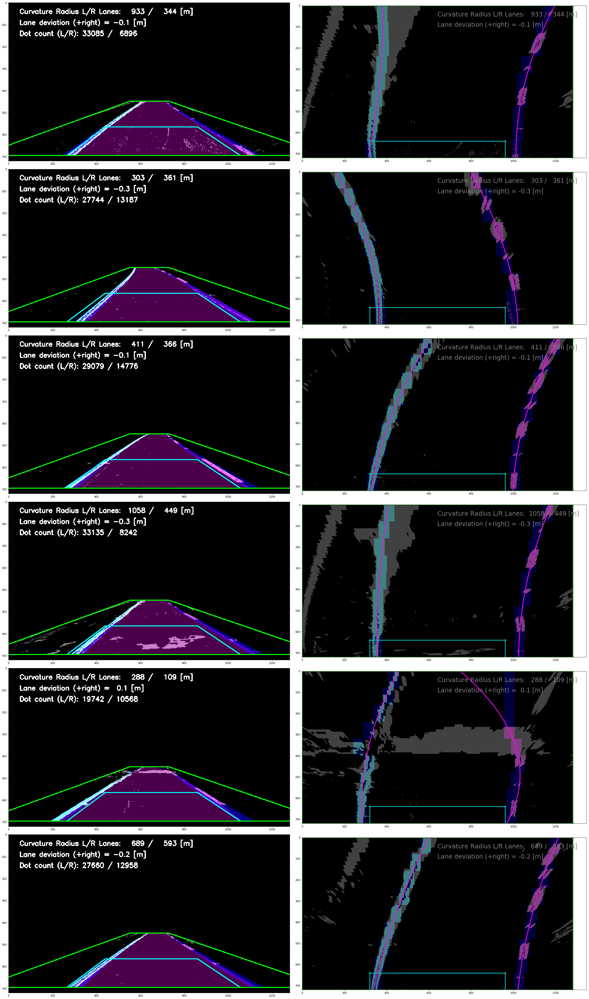

In [52]:
f, ax = plt.subplots(6, 2, figsize=(32,54))
ax = ax.flatten()
f.tight_layout()

for idx, img_in in enumerate(combo_images):

    img_bird = myXform.transform(img_in)

    # call function in main.py
#     left_fit, right_fit, tmp1, tmp2 = find_curvatures(img_bird, (None,None), margin=50)
    ret = find_curvatures(img_bird, (None, None), w_width=50, w_hgt=80, margin=50)
    (fit_valid, myLine.left_fit, myLine.right_fit, found_start_pts, debug_img, dots) = ret

    # create x,y points for lane line to be plotted, in bird's eye view
    left_line_bird = laneline(img_bird, myLine.left_fit)
    right_line_bird = laneline(img_bird, myLine.right_fit)
    
    # calc engineering unit parameters
    left_radius_m, right_radius_m, deviation = calc_engr_unit_parms(img_bird,
                                                                    left_line_bird, right_line_bird,
                                                                    m_per_pixel_x, m_per_pixel_y)

    # create image w/ magic lane carpet
    left_line_driver = myXform.inv_transform_pts(left_line_bird)
    right_line_driver = myXform.inv_transform_pts(right_line_bird)

    carpet_pts = np.hstack((left_line_driver, np.flip(right_line_driver, axis=1)))

    carpet_img = np.zeros_like(test_images[idx])
    carpet_img = cv2.fillPoly(carpet_img, np.int_(carpet_pts), (255,0,255))

    #DEBUG
#     pts_img_bird = np.repeat(np.expand_dims(pts_img_bird_bin*255,axis=2), 3, axis=2)
    pts_img_driver = myXform.inv_transform(debug_img)
    
    # combine with orig image

#     pts_img_driver = np.repeat(np.expand_dims(pts_img_driver_bin*255, axis=2), 3, axis=2)
    img_with_carpet = cv2.addWeighted(pts_img_driver, 1.0, carpet_img, 0.3, 0)

#     img_combo_color = np.repeat(np.expand_dims(pts_img_driver*255,axis=2), 3, axis=2)
#     img_with_carpet = cv2.addWeighted(img_combo_color, 1.0, carpet_img, 0.3, 0)

#     img_with_carpet = cv2.addWeighted(img, 1.0, carpet_img, 0.3, 0)

    # cv2 annotate
    cv2.putText(img_with_carpet,
                'Curvature Radius L/R Lanes: {:5.0f} / {:5.0f} [m]'.format(left_radius_m, right_radius_m),
                (50,50), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255,255,255), thickness=3)
    cv2.putText(img_with_carpet,
                'Lane deviation (+right) = {:4.1f} [m]'.format(deviation),
                (50,100), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255,255,255), thickness=3)
    cv2.putText(img_with_carpet,'Dot count (L/R): {:5.0f} / {:5.0f}'.format(dots[0], dots[1]),
                (50,150), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255,255,255), thickness=3)
    cv2.polylines(img_with_carpet, np.array([src_road.astype('int32')]), isClosed=False, color=(0,255,255), thickness=3)
    cv2.polylines(img_with_carpet, driver_view_border.astype('int32'), isClosed=False, color=(0,255,0), thickness=3)
    

    # -- Plot images --
    # Left img (driver view)
    idx_l = 2*idx
#     ax[idx_l].imshow(test_images[idx])
    ax[idx_l].imshow(img_with_carpet)

    # Right img (bird view)
    idx_r = 2*idx+1
    image_bird = cv2.addWeighted(cv2.cvtColor(img_bird, cv2.COLOR_GRAY2RGB), 1.0, debug_img, 0.5, 0)
    ax[idx_r].imshow(image_bird)
    ax[idx_r].plot(dst_x, dst_y,'co-', linewidth=3)
    ax[idx_r].plot(left_line_bird[0,:,0], left_line_bird[0,:,1],
                   right_line_bird[0,:,0], right_line_bird[0,:,1],
                   color='magenta', linewidth=3)
#     ax[idx_r].plot(left_fitx, ploty, right_fitx, ploty, color='magenta', linewidth=3)
    ax[idx_r].plot(bird_view_border[0,:,0], bird_view_border[0,:,1], 'go-', linewidth=3)
    ax[idx_r].text(640, 50, 'Curvature Radius L/R Lanes: {:5.0f} / {:5.0f} [m]'.format(left_radius_m, right_radius_m),
                   color='gray', size='24')
    ax[idx_r].text(640, 100, 'Lane deviation (+right) = {:4.1f} [m]'.format(deviation),
                   color='gray', size='24')
    ax[idx_r].set_ylim(ymax, 0)

plt.show()

## Let's build all of the above into a pipeline

In [32]:
myLine.origin = (None, None)

In [54]:
def find_lane_lines(img):
    
    # NOTE - Currently this function still needs access to external class instances:
    # - myLine
    # - myCal
    # - myXform
    
    # correct for distortion
    img_undistorted = myCal.apply(img)

    # process image (combine sobel-X and HLS S-ch)
    img_gray = cv2.cvtColor(img_undistorted, cv2.COLOR_RGB2GRAY)
    img_sbx = abs_sobel_thresh(img_gray, orient='x', sobel_kernel=3, thresh=(20,200))
    img_sbin = hls_thresh(img_undistorted, ch_sel='s', thresh=(170,255))
    img_combo = (img_sbx | img_sbin)

    img_bird = myXform.transform(img_combo)

    ret = find_curvatures(img_bird, myLine.origin, w_width=80, w_hgt=80, margin=50)
    (fit_valid, left_fit_new, right_fit_new, myLine.origin, debug_img, dots) = ret

    #DEBUG
#     pts_img_bird = np.repeat(np.expand_dims(pts_img_bird_bin*255,axis=2), 3, axis=2)
    pts_img_driver = myXform.inv_transform(debug_img)
    
    # ---> insert line performance monitor here <---
    if (fit_valid==True):
        myLine.left_fit = left_fit_new
        myLine.right_fit = right_fit_new
        validity_color = (255,255,255) # white
    else:
        # for invalid, keep previous line fits
        myLine.origin = (None, None)
        validity_color = (255,0,0) # red
    # ---> insert line performance monitor here <---
    
    # create x,y points for lane line to be plotted, in bird's eye view
    left_line_bird = laneline(img_bird, myLine.left_fit)
    right_line_bird = laneline(img_bird, myLine.right_fit)

    left_radius_m, right_radius_m, deviation = calc_engr_unit_parms(img_bird,
                                                                    left_line_bird, right_line_bird,
                                                                    m_per_pixel_x, m_per_pixel_y)

    # create image w/ magic lane carpet
    left_line_driver = myXform.inv_transform_pts(left_line_bird)
    right_line_driver = myXform.inv_transform_pts(right_line_bird)
    carpet_pts = np.hstack((left_line_driver, np.flip(right_line_driver, axis=1)))
    carpet_img = np.zeros_like(img)
    carpet_img = cv2.fillPoly(carpet_img, np.int_(carpet_pts), (255,0,255)) # magenta color
    
    # combine with orig image
    
#     img_with_carpet = cv2.addWeighted(pts_img_driver, 1.0, carpet_img, 0.3, 0)

#     img_combo_color = np.repeat(np.expand_dims(pts_img_driver*255,axis=2), 3, axis=2)
#     img_with_carpet = cv2.addWeighted(img_combo_color, 1.0, carpet_img, 0.3, 0)

    img_with_carpet = cv2.addWeighted(img, 1.0, carpet_img, 0.3, 0)


    # annotate
    cv2.putText(img_with_carpet,
                'Curvature Radius L/R Lanes: {:5.0f} / {:5.0f} [m]'.format(left_radius_m, right_radius_m),
                (50,50), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255,255,255), thickness=3)
    cv2.putText(img_with_carpet,
                'Lane deviation (+right) = {:4.1f} [m]'.format(deviation),
                (50,100), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255,255,255), thickness=3)
    cv2.putText(img_with_carpet,'Tracked lane pixel counts (L/R): {:5.0f} / {:5.0f}'.format(dots[0], dots[1]),
                (50,150), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=validity_color, thickness=3)
    cv2.polylines(img_with_carpet, np.array([src_road.astype('int32')]),
                  isClosed=False, color=(0,255,255), thickness=3) # 12'x10' box
    cv2.polylines(img_with_carpet, driver_view_border.astype('int32'),
                  isClosed=False, color=(0,255,0), thickness=3) # bird's view border
    
    return img_with_carpet

# Now try it on the video clip!

In [34]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
# from IPython.display import HTML

In [35]:
import moviepy
moviepy.__version__

'0.2.2.13'

In [36]:
# import imageio
# imageio.plugins.ffmpeg.download()

### project_video.mp4

In [37]:
vid_output = 'my_project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")

In [55]:
myLine.origin = (None, None)
vid1_clip = clip1.fl_image(find_lane_lines) #NOTE: this function expects color images!!
%time vid1_clip.write_videofile(vid_output, audio=False)

find_window_centroids(): Cold starting window centroid search...
[MoviePy] >>>> Building video my_harder_challenge_video.mp4
[MoviePy] Writing video my_harder_challenge_video.mp4


 44%|████▍     | 558/1261 [01:51<02:10,  5.38it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 79%|███████▉  | 1002/1261 [03:21<00:50,  5.16it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 84%|████████▎ | 1053/1261 [03:31<00:44,  4.70it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


100%|█████████▉| 1260/1261 [04:12<00:00,  5.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: my_harder_challenge_video.mp4 

CPU times: user 4min 53s, sys: 41.4 s, total: 5min 34s
Wall time: 4min 13s


### challenge_video.mp4

In [49]:
myLine.origin = (None, None)
vid_output = 'my_challenge_video.mp4'
clip2 = VideoFileClip("challenge_video.mp4")
vid2_clip = clip2.fl_image(find_lane_lines) #NOTE: this function expects color images!!
%time vid2_clip.write_videofile(vid_output, audio=False)

find_window_centroids(): Cold starting window centroid search...
[MoviePy] >>>> Building video my_challenge_video.mp4
[MoviePy] Writing video my_challenge_video.mp4


 20%|██        | 98/485 [00:18<01:16,  5.08it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 25%|██▌       | 123/485 [00:23<01:07,  5.37it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 26%|██▌       | 125/485 [00:23<01:07,  5.32it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 26%|██▌       | 126/485 [00:24<01:07,  5.30it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 26%|██▋       | 128/485 [00:24<01:08,  5.23it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 27%|██▋       | 129/485 [00:24<01:07,  5.27it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 27%|██▋       | 131/485 [00:24<01:07,  5.28it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 27%|██▋       | 132/485 [00:25<01:06,  5.27it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 28%|██▊       | 134/485 [00:25<01:06,  5.32it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 28%|██▊       | 135/485 [00:25<01:05,  5.32it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 28%|██▊       | 137/485 [00:26<01:05,  5.29it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 28%|██▊       | 138/485 [00:26<01:06,  5.22it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 29%|██▉       | 140/485 [00:26<01:06,  5.16it/s]

find_window_centroids(): Cold starting window centroid search...


 30%|███       | 146/485 [00:27<01:03,  5.34it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 87%|████████▋ | 424/485 [01:20<00:13,  4.67it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


100%|██████████| 485/485 [01:33<00:00,  5.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: my_challenge_video.mp4 

CPU times: user 1min 50s, sys: 15.1 s, total: 2min 5s
Wall time: 1min 34s


### harder_challenge_video.mp4

In [50]:
myLine.origin = (None, None)
vid_output = 'my_harder_challenge_video.mp4'
clip3 = VideoFileClip("harder_challenge_video.mp4")
vid3_clip = clip3.fl_image(find_lane_lines) #NOTE: this function expects color images!!
%time vid3_clip.write_videofile(vid_output, audio=False)

find_window_centroids(): Cold starting window centroid search...
[MoviePy] >>>> Building video my_harder_challenge_video.mp4
[MoviePy] Writing video my_harder_challenge_video.mp4


 13%|█▎        | 161/1200 [00:31<03:34,  4.83it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▎        | 162/1200 [00:31<03:38,  4.75it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▎        | 163/1200 [00:31<03:41,  4.69it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▎        | 164/1200 [00:32<03:42,  4.65it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▍        | 165/1200 [00:32<03:41,  4.67it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▍        | 166/1200 [00:32<03:43,  4.63it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▍        | 167/1200 [00:32<03:40,  4.68it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 14%|█▍        | 168/1200 [00:32<03:45,  4.57it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: right_fit


 14%|█▍        | 170/1200 [00:33<03:39,  4.69it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: right_fit


 14%|█▍        | 171/1200 [00:33<03:35,  4.77it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...

 14%|█▍        | 172/1200 [00:33<03:38,  4.71it/s]


Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 16%|█▌        | 190/1200 [00:37<03:26,  4.89it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 44%|████▍     | 533/1200 [01:44<02:07,  5.22it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 57%|█████▋    | 680/1200 [02:12<01:38,  5.30it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 74%|███████▍  | 887/1200 [02:55<01:02,  5.00it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 81%|████████  | 970/1200 [03:11<00:43,  5.27it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 81%|████████  | 972/1200 [03:12<00:43,  5.24it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 81%|████████▏ | 976/1200 [03:12<00:42,  5.28it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 82%|████████▏ | 978/1200 [03:13<00:42,  5.20it/s]

find_window_centroids(): Cold starting window centroid search...


 82%|████████▏ | 981/1200 [03:13<00:44,  4.95it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 82%|████████▏ | 986/1200 [03:14<00:41,  5.15it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 82%|████████▏ | 987/1200 [03:14<00:42,  5.06it/s]

Fit FAIL: left_fit
Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
Fit FAIL: right_fit


 82%|████████▏ | 989/1200 [03:15<00:40,  5.19it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 82%|████████▎ | 990/1200 [03:15<00:40,  5.20it/s]

Fit FAIL: left_fit
Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 83%|████████▎ | 992/1200 [03:15<00:40,  5.11it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 83%|████████▎ | 993/1200 [03:16<00:41,  4.98it/s]

find_window_centroids(): Cold starting window centroid search...


 83%|████████▎ | 996/1200 [03:16<00:38,  5.23it/s]

Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 83%|████████▎ | 998/1200 [03:17<00:38,  5.21it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 83%|████████▎ | 999/1200 [03:17<00:38,  5.24it/s]

Fit FAIL: left_fit
Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
Fit FAIL: right_fit


 83%|████████▎ | 1001/1200 [03:17<00:38,  5.19it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
Fit FAIL: right_fit
find_window_centroids(): Cold starting window centroid search...


 84%|████████▎ | 1002/1200 [03:17<00:38,  5.14it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 84%|████████▎ | 1004/1200 [03:18<00:37,  5.21it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 84%|████████▍ | 1005/1200 [03:18<00:37,  5.23it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 84%|████████▍ | 1007/1200 [03:18<00:36,  5.22it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 84%|████████▍ | 1008/1200 [03:19<00:36,  5.23it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 84%|████████▍ | 1009/1200 [03:19<00:37,  5.04it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


 84%|████████▍ | 1010/1200 [03:19<00:38,  4.98it/s]

Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit


 84%|████████▍ | 1012/1200 [03:19<00:36,  5.09it/s]

find_window_centroids(): Cold starting window centroid search...
Fit FAIL: left_fit
find_window_centroids(): Cold starting window centroid search...


100%|█████████▉| 1199/1200 [03:58<00:00,  4.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: my_harder_challenge_video.mp4 

CPU times: user 4min 37s, sys: 39.3 s, total: 5min 17s
Wall time: 3min 59s
